In [145]:
import requests
from PIL import Image

In [146]:
subscripton_key = 'f5c1da89cdf5450eaeddabbec06866c8'

In [147]:
assert SUBSCRIPTION_KEY

In [148]:
face_api_url = 'https://macbook-tanaka220608.cognitiveservices.azure.com/face/v1.0/detect'

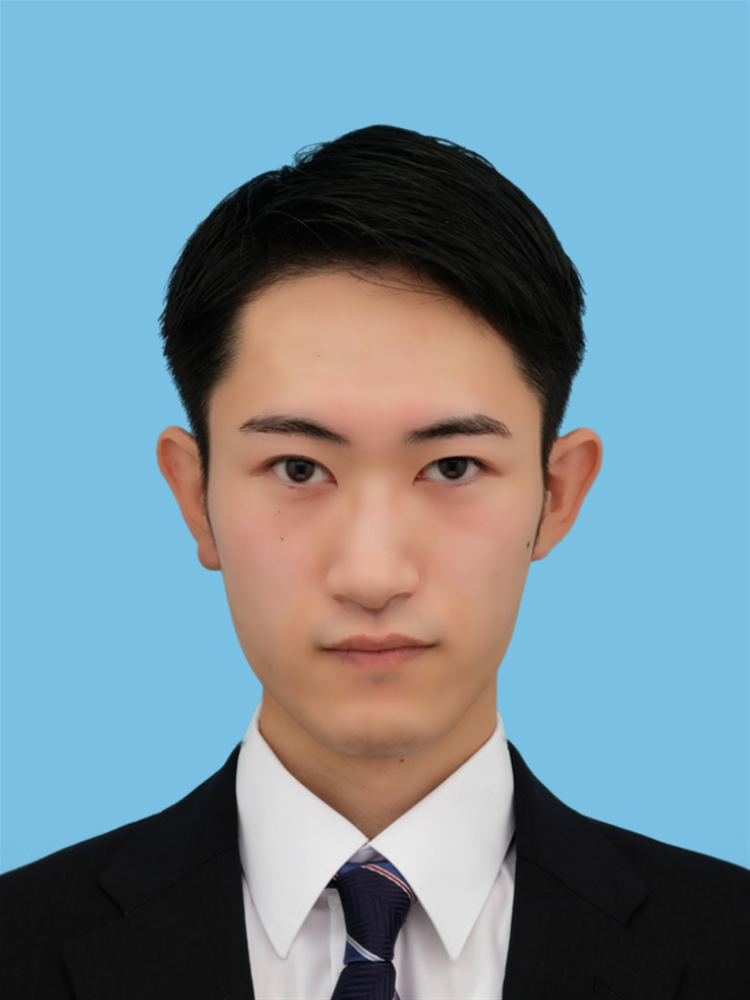

In [149]:
img = Image.open('証明写真.jpg')
img

In [150]:
with open('証明写真.jpg','rb') as f:
    binary_img = f.read()

In [151]:
headers = {
    'Content-Type':'application/octet-stream',
    'Ocp-Apim-Subscription-Key' : subscripton_key
}

params = {
    'retrunFaceId':'true',
    'returnFaceAttributes': 'blur,exposure,noise,age,gender,facialhair,glasses,hair,makeup,accessories,occlusion,headpose,emotion,smile'
}

res = requests.post(face_api_url,params=params,headers=headers,data = binary_img)

In [152]:
res

<Response [200]>

In [153]:
result = res.json()
result

[{'faceId': 'fe0d2809-85fb-4037-b854-3bfb4e88ea28',
  'faceRectangle': {'top': 1055, 'left': 548, 'width': 1007, 'height': 1007},
  'faceAttributes': {'smile': 0.0,
   'headPose': {'pitch': -9.2, 'roll': 0.6, 'yaw': -0.6},
   'gender': 'male',
   'age': 23.0,
   'facialHair': {'moustache': 0.1, 'beard': 0.1, 'sideburns': 0.1},
   'glasses': 'NoGlasses',
   'emotion': {'anger': 0.0,
    'contempt': 0.0,
    'disgust': 0.0,
    'fear': 0.0,
    'happiness': 0.0,
    'neutral': 1.0,
    'sadness': 0.0,
    'surprise': 0.0},
   'blur': {'blurLevel': 'medium', 'value': 0.3},
   'exposure': {'exposureLevel': 'goodExposure', 'value': 0.64},
   'noise': {'noiseLevel': 'low', 'value': 0.0},
   'makeup': {'eyeMakeup': True, 'lipMakeup': False},
   'accessories': [],
   'occlusion': {'foreheadOccluded': False,
    'eyeOccluded': False,
    'mouthOccluded': False},
   'hair': {'bald': 0.21,
    'invisible': False,
    'hairColor': [{'color': 'black', 'confidence': 1.0},
     {'color': 'other', 'co

In [158]:
rect = result[0]['faceAttributes']['age']
rect

23.0

In [102]:
from PIL import ImageDraw
draw = ImageDraw.Draw(img)

In [103]:
draw.rectangle([(rect['left'],rect['top']),(rect['left']+rect['width'],rect['top']+rect['height'])],fill=None,outline='green',width=5)

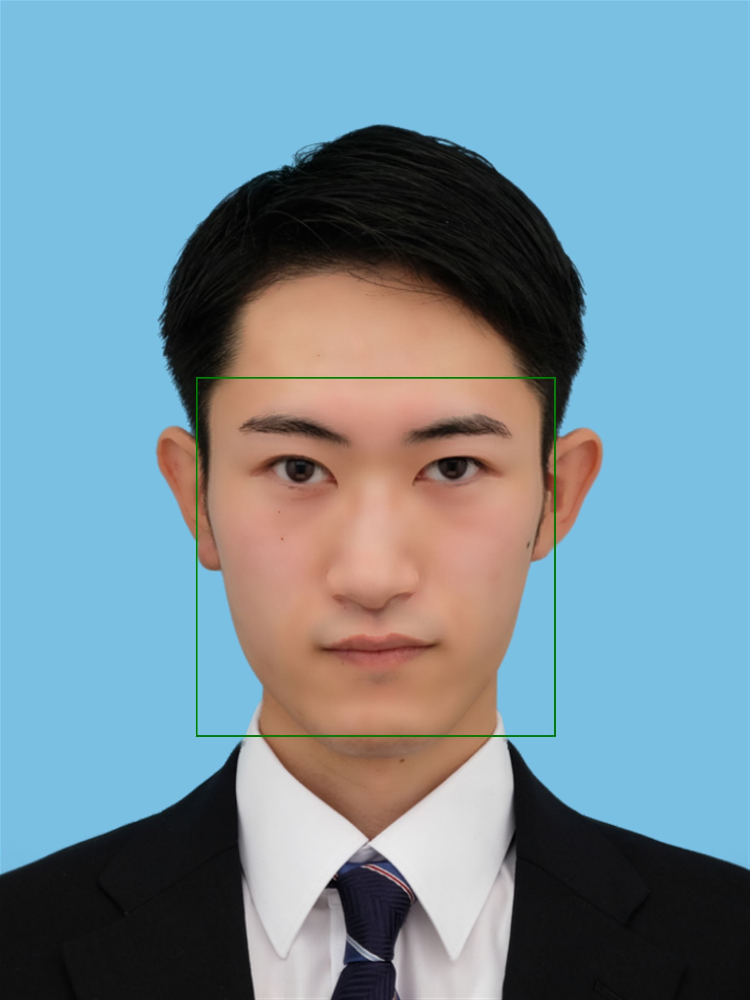

In [104]:
img

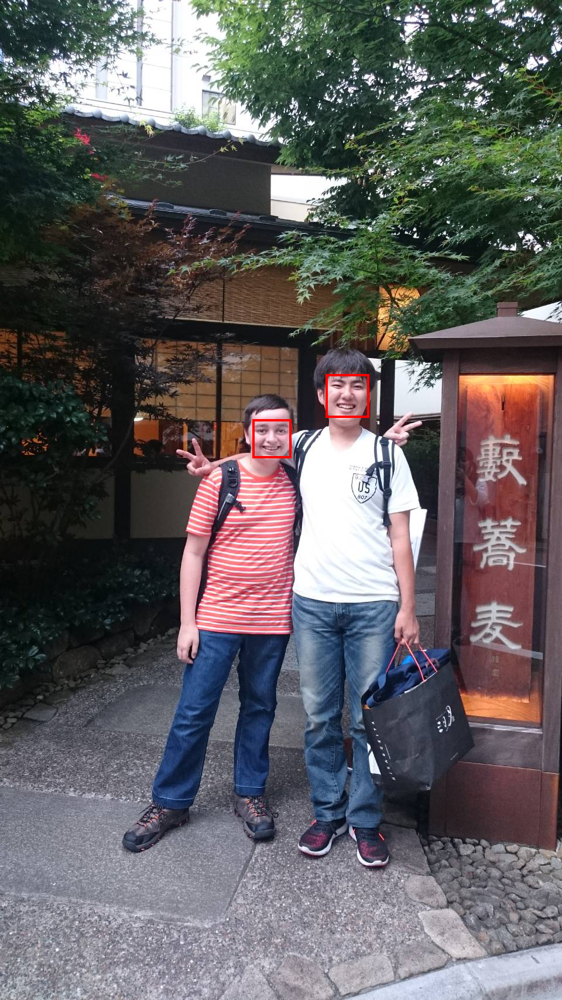

In [119]:

import requests
from PIL import Image
from PIL import ImageDraw
from PIL import ImageFont
textcolor = 'white'
textsize = 50

subscripton_key = 'f5c1da89cdf5450eaeddabbec06866c8'
assert SUBSCRIPTION_KEY

face_api_url = 'https://macbook-tanaka220608.cognitiveservices.azure.com/face/v1.0/detect'

img = Image.open('証明写真.jpg')
with open('証明写真.jpg','rb') as f:
    binary_img = f.read()

headers = {
    'Content-Type':'application/octet-stream',
    'Ocp-Apim-Subscription-Key' : subscripton_key
}
params = {
    'retrunFaceId':'true',
    'returnFaceAttributes': 'blur,exposure,noise,age,gender,facialhair,glasses,hair,makeup,accessories,occlusion,headpose,emotion,smile'
}
res = requests.post(face_api_url,params=params,headers=headers,data = binary_img)
results = res.json()
for result in results:
    rect = result['faceRectangle']
    draw = ImageDraw.Draw(img)
    draw.rectangle([(rect['left'],rect['top']),(rect['left']+rect['width'],rect['top']+rect['height'])],fill=None,outline='red',width=4)
    age = str(result['faceAttributes']['age'])
    gender = result['faceAttributes']['gender']
    text = '年齢: '+age+'歳、性別: '+gender
    txpos = (rect['left'], rect['top']-textsize-linewidth//2)
    draw.text(txpos, text, font=font, fill=textcolor)
img

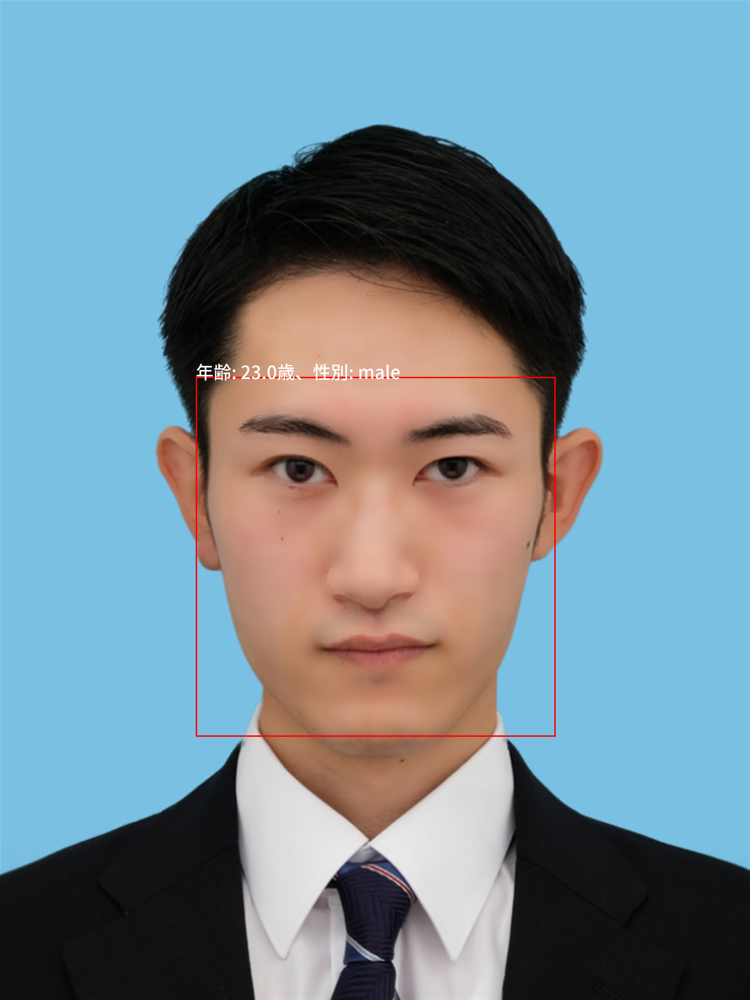

In [193]:
#練習

import requests
from PIL import Image
from PIL import ImageDraw
from PIL import ImageFont
textcolor = 'white'
textsize = 50

subscripton_key = 'f5c1da89cdf5450eaeddabbec06866c8'
assert SUBSCRIPTION_KEY

face_api_url = 'https://macbook-tanaka220608.cognitiveservices.azure.com/face/v1.0/detect'

img = Image.open('証明写真.jpg')
with io.BytesIO() as output:
    img.save(output,format='JPEG')
    binary_img = output.getvalue()

headers = {
    'Content-Type':'application/octet-stream',
    'Ocp-Apim-Subscription-Key' : subscripton_key
}
params = {
    'retrunFaceId':'true',
    'returnFaceAttributes': 'blur,exposure,noise,age,gender,facialhair,glasses,hair,makeup,accessories,occlusion,headpose,emotion,smile'
}
res = requests.post(face_api_url,params=params,headers=headers,data = binary_img)
results = res.json()
for result in results:
    rect = result['faceRectangle']
    draw = ImageDraw.Draw(img)
    draw.rectangle([(rect['left'],rect['top']),(rect['left']+rect['width'],rect['top']+rect['height'])],fill=None,outline='red',width=4)
    age = str(result['faceAttributes']['age'])
    gender = result['faceAttributes']['gender']
    text = '年齢: '+age+'歳、性別: '+gender
    txpos = (rect['left'], rect['top']-textsize-linewidth//2)
    draw.text(txpos, text, font=font, fill=textcolor)
img

In [194]:
import io

In [196]:
with io.BytesIO() as output:
    img.save(output,format='JPEG')
    binary_img = output.getvalue()